# Линейные модели, SVM и деревья решений.


1. Выберите набор данных (датасет) для решения задачи классификации или регрессии.
2. В случае необходимости проведите удаление или заполнение пропусков и кодирование категориальных признаков.
3. С использованием метода train_test_split разделите выборку на обучающую и тестовую.
4. Обучите следующие модели:
  - одну из линейных моделей (линейную или полиномиальную регрессию при решении задачи регрессии, логистическую регрессию при решении задачи классификации);
  - SVM;
  - дерево решений.
5. Оцените качество моделей с помощью двух подходящих для задачи метрик. Сравните качество полученных моделей.
6. Постройте график, показывающий важность признаков в дереве решений.
7. Визуализируйте дерево решений или выведите правила дерева решений в текстовом виде.

In [1]:
import numpy as np
import pandas as pd
from typing import Dict, Tuple
from scipy import stats
from scipy.optimize import fmin_tnc
from IPython.display import Image
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.metrics import accuracy_score, balanced_accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, median_absolute_error, r2_score 
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import SGDClassifier
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

## Описание данных

In [2]:
data = pd.read_csv('laptop_cleaned2.csv', sep=",")


In [3]:
data.shape

(1020, 29)

In [4]:
data.dtypes

Unnamed: 0                  int64
Name                       object
Brand                      object
Price                       int64
Rating                    float64
Processor_brand            object
Processor_name             object
Processor_variant          object
Processor_gen             float64
Core_per_processor        float64
Total_processor           float64
Execution_units           float64
Low_Power_Cores           float64
Energy_Efficient_Units      int64
Threads                   float64
RAM_GB                      int64
RAM_type                   object
Storage_capacity_GB         int64
Storage_type               object
Graphics_name              object
Graphics_brand             object
Graphics_GB               float64
Graphics_integreted        object
Display_size_inches       float64
Horizontal_pixel            int64
Vertical_pixel              int64
ppi                       float64
Touch_screen                 bool
Operating_system           object
dtype: object

In [5]:
data.head(10)

,Unnamed: 0,Name,Brand,Price,Rating,Processor_brand,Processor_name,Processor_variant,Processor_gen,Core_per_processor,...,Graphics_name,Graphics_brand,Graphics_GB,Graphics_integreted,Display_size_inches,Horizontal_pixel,Vertical_pixel,ppi,Touch_screen,Operating_system
0,0,HP Victus 15-fb0157AX Gaming Laptop (AMD Ryzen...,HP,50399,4.30,AMD,AMD Ryzen 5,5600H,5.0,6.0,...,AMD Radeon RX 6500M,AMD,4.0,False,15.6,1920,1080,141.21,True,Windows 11 OS
1,1,Lenovo V15 G4 ‎82YU00W7IN Laptop (AMD Ryzen 3 ...,Lenovo,26690,4.45,AMD,AMD Ryzen 3,7320U,7.0,4.0,...,AMD Radeon Graphics,AMD,NaN,False,15.6,1920,1080,141.21,False,Windows 11 OS
2,2,HP 15s-fq5007TU Laptop (12th Gen Core i3/ 8GB/...,HP,37012,4.65,Intel,Intel Core i3,1215U,12.0,6.0,...,Intel UHD Graphics,Intel,NaN,False,15.6,1920,1080,141.21,False,Windows 11 OS
3,3,Samsung Galaxy Book2 Pro 13 Laptop (12th Gen C...,Samsung,69990,4.75,Intel,Intel Core i5,1240P,12.0,12.0,...,Intel Iris Xe Graphics,Intel,NaN,False,13.3,1080,1920,165.63,False,Windows 11 OS
4,4,Tecno Megabook T1 Laptop (11th Gen Core i3/ 8G...,Tecno,23990,4.25,Intel,Intel Core i3,1115G4,11.0,2.0,...,Intel UHD Graphics,Intel,NaN,False,15.6,1920,1080,141.21,False,Windows 11 OS
5,5,Samsung Galaxy Book2 NP550XED-KA1IN 15 Laptop ...,Samsung,42990,4.35,Intel,Intel Core i5,1235U,12.0,10.0,...,Intel Integrated UHD,Intel,NaN,True,15.6,1920,1080,141.21,False,Windows 11 OS
6,6,Xiaomi Redmi G Pro 2024 Gaming Laptop (14th Ge...,Xiaomi,102990,4.25,Intel,Intel Core i9,14900HX,14.0,24.0,...,NVIDIA GeForce RTX 4060,NVIDIA,8.0,False,16.1,2560,1600,187.51,False,Windows 11 OS
7,7,Dell Inspiron 3520 D560896WIN9B Laptop (12th G...,Dell,33780,4.75,Intel,Intel Core i3,1215U,12.0,6.0,...,Intel UHD Graphics,Intel,NaN,False,15.6,1920,1080,141.21,False,Windows 11 OS
8,8,HP 15s-fq5330TU Laptop (12th Gen Core i5/ 16GB...,HP,54990,4.00,Intel,Intel Core i5,1235U,12.0,10.0,...,Intel Integrated Iris Xe,Intel,NaN,True,15.6,1920,1080,141.21,False,Windows 11 OS
9,9,Asus Vivobook 15 X1502ZA-EJ544WS Laptop (12th ...,Asus,55980,4.55,Intel,Intel Core i5,12500H,12.0,12.0,...,Intel Iris Xe,Intel,NaN,False,15.6,1920,1080,141.21,False,Windows 11 OS


In [6]:
data.isnull().sum()
 

Unnamed: 0                  0
Name                        0
Brand                       0
Price                       0
Rating                      0
Processor_brand             0
Processor_name              0
Processor_variant          24
Processor_gen             129
Core_per_processor         12
Total_processor           447
Execution_units           447
Low_Power_Cores             0
Energy_Efficient_Units      0
Threads                    48
RAM_GB                      0
RAM_type                   22
Storage_capacity_GB         0
Storage_type                0
Graphics_name               2
Graphics_brand              2
Graphics_GB               652
Graphics_integreted         2
Display_size_inches         0
Horizontal_pixel            0
Vertical_pixel              0
ppi                         0
Touch_screen                0
Operating_system            0
dtype: int64

In [7]:
data = data.dropna(axis=1, how="any")

In [8]:
data.isnull().sum()


Unnamed: 0                0
Name                      0
Brand                     0
Price                     0
Rating                    0
Processor_brand           0
Processor_name            0
Low_Power_Cores           0
Energy_Efficient_Units    0
RAM_GB                    0
Storage_capacity_GB       0
Storage_type              0
Display_size_inches       0
Horizontal_pixel          0
Vertical_pixel            0
ppi                       0
Touch_screen              0
Operating_system          0
dtype: int64

In [9]:
data.dtypes

Unnamed: 0                  int64
Name                       object
Brand                      object
Price                       int64
Rating                    float64
Processor_brand            object
Processor_name             object
Low_Power_Cores           float64
Energy_Efficient_Units      int64
RAM_GB                      int64
Storage_capacity_GB         int64
Storage_type               object
Display_size_inches       float64
Horizontal_pixel            int64
Vertical_pixel              int64
ppi                       float64
Touch_screen                 bool
Operating_system           object
dtype: object

In [10]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["Name_id"] = le.fit_transform(data['Name'])
data["Brand_id"] = le.fit_transform(data['Brand'])
data["Processor_brand_id"] = le.fit_transform(data['Processor_brand'])
data["Processor_name_id"] = le.fit_transform(data['Processor_name'])
data["Storage_type_id"] = le.fit_transform(data['Storage_type'])
data["Touch_screen_bit"] = le.fit_transform(data['Touch_screen'])
data["Operating_system_id"] = le.fit_transform(data['Operating_system'])


In [11]:
numeric_data = data.select_dtypes(["number"])

<Axes: >

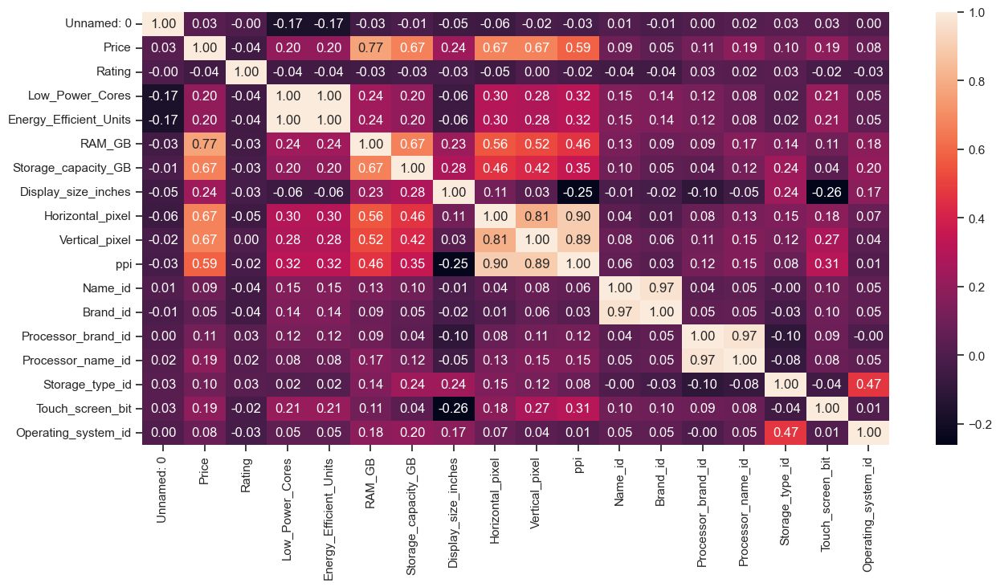

In [12]:
#Построим корреляционную матрицу
fig, ax = plt.subplots(figsize=(15,7))
sns.heatmap(numeric_data.corr(method='pearson'), ax=ax, annot=True, fmt='.2f')

Возьмем цену ноутбука в качестве целевого признака. Видим, что с целевым признаком коэффициент корреляции выше всего у признака "RAM_GB".

<Axes: xlabel='RAM_GB', ylabel='Price'>

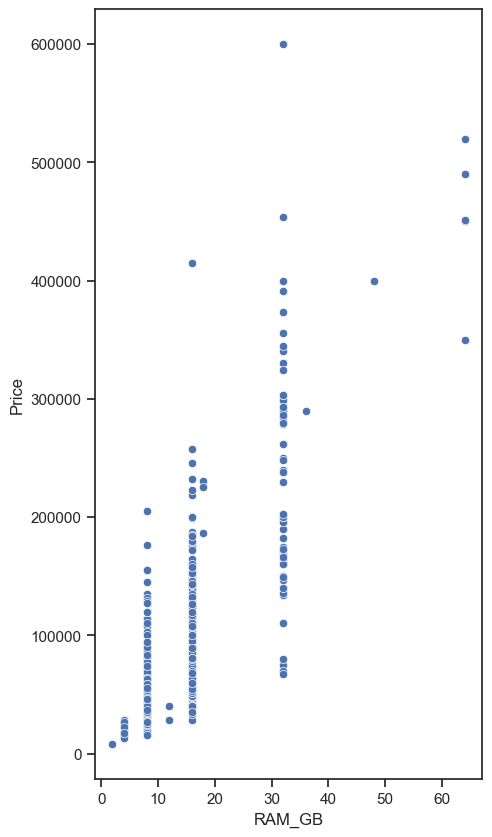

In [13]:
fig, ax = plt.subplots(figsize=(5,10)) 
sns.scatterplot(ax=ax, x='RAM_GB', y='Price', data=data)

In [14]:
x_train, x_test, y_train, y_test = train_test_split(
    numeric_data.drop(["Price"], axis=1), data["Price"], test_size=0.2, random_state=1)

In [15]:
# Аналитическое вычисление коэффициентов регрессии
def analytic_regr_coef(x_array : np.ndarray, 
                       y_array : np.ndarray) -> Tuple[float, float]:
    x_mean = np.mean(x_array)
    y_mean = np.mean(y_array)
    var1 = np.sum([(x-x_mean)**2 for x in x_array])
    cov1 = np.sum([(x-x_mean)*(y-y_mean) for x, y in zip(x_array, y_array)])
    b1 = cov1 / var1
    b0 = y_mean - b1*x_mean
    return b0, b1

In [16]:
x_array = data['RAM_GB'].values
y_array = data['Price'].values

In [17]:
b0, b1 = analytic_regr_coef(x_array, y_array)
b0, b1

(-17138.53602856121, 7089.829789036747)

In [18]:
# Вычисление значений y на основе x для регрессии
def y_regr(x_array : np.ndarray, b0: float, b1: float) -> np.ndarray:
    res = [b1*x+b0 for x in x_array]
    return res

In [19]:
y_array_regr = y_regr(x_array, b0, b1)

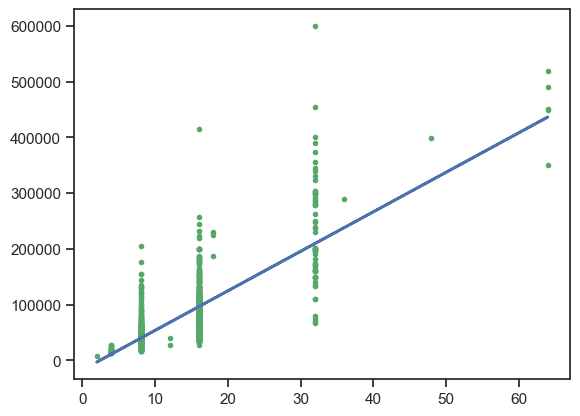

In [20]:
plt.plot(x_array, y_array, 'g.')
plt.plot(x_array, y_array_regr, 'b', linewidth=2.0)
plt.show()

## Восстановление зависимости с использованием численных методов

### [Метод наименьших квадратов](https://ru.wikipedia.org/wiki/%D0%9C%D0%B5%D1%82%D0%BE%D0%B4_%D0%BD%D0%B0%D0%B8%D0%BC%D0%B5%D0%BD%D1%8C%D1%88%D0%B8%D1%85_%D0%BA%D0%B2%D0%B0%D0%B4%D1%80%D0%B0%D1%82%D0%BE%D0%B2)

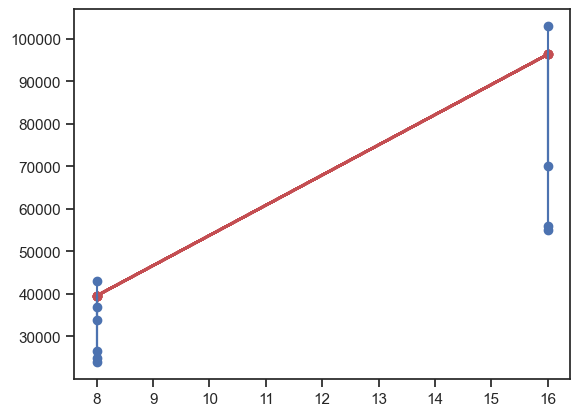

In [21]:
# Синими отрезками показаны ошибки между 
# истинными и предсказанными значениями
K_mnk=10

plt.plot(x_array[1:K_mnk+1], y_array[1:K_mnk+1], 'bo')
plt.plot(x_array[1:K_mnk+1], y_array_regr[1:K_mnk+1], '-ro', linewidth=2.0)

for i in range(len(x_array[1:K_mnk+1])):
    x1 = x_array[1:K_mnk+1][i]
    y1 = y_array[1:K_mnk+1][i]
    y2 = y_array_regr[1:K_mnk+1][i]
    plt.plot([x1,x1],[y1,y2],'b-')

plt.show()

## [Градиентный спуск](https://ru.wikipedia.org/wiki/%D0%93%D1%80%D0%B0%D0%B4%D0%B8%D0%B5%D0%BD%D1%82%D0%BD%D1%8B%D0%B9_%D1%81%D0%BF%D1%83%D1%81%D0%BA) или метод наискорейшего спуска

In [22]:
# Простейшая реализация градиентного спуска
def gradient_descent(x_array : np.ndarray,
                     y_array : np.ndarray,
                     b0_0 : float,
                     b1_0 : float,
                     epochs : int,
                     learning_rate : float = 0.001
                    ) -> Tuple[float, float]:
    # Значения для коэффициентов по умолчанию
    b0, b1 = b0_0, b1_0
    k = float(len(x_array))
    for i in range(epochs): 
        # Вычисление новых предсказанных значений
        # используется векторизованное умножение и сложение для вектора и константы
        y_pred = b1 * x_array + b0
        # Расчет градиентов
        # np.multiply - поэлементное умножение векторов
        dL_db1 = (-2/k) * np.sum(np.multiply(x_array, (y_array - y_pred)))
        dL_db0 = (-2/k) * np.sum(y_array - y_pred)
        # Изменение значений коэффициентов:
        b1 = b1 - learning_rate * dL_db1
        b0 = b0 - learning_rate * dL_db0
    # Результирующие значения
    y_pred = b1 * x_array + b0
    return b0, b1, y_pred
    

In [23]:
def show_gradient_descent(epochs, b0_0, b1_0):
    grad_b0, grad_b1, grad_y_pred = gradient_descent(x_array, y_array, b0_0, b1_0, epochs)
    print('b0 = {} - (теоретический), {} - (градиентный спуск)'.format(b0, grad_b0))
    print('b1 = {} - (теоретический), {} - (градиентный спуск)'.format(b1, grad_b1))
    print('MSE = {}'.format(mean_squared_error(y_array_regr, grad_y_pred)))
    plt.plot(x_array, y_array, 'g.')
    plt.plot(x_array, y_array_regr, 'b', linewidth=2.0)
    plt.plot(x_array, grad_y_pred, 'r', linewidth=2.0)
    plt.show()

b0 = -17138.53602856121 - (теоретический), 272.29918407655947 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 6097.95983564186 - (градиентный спуск)
MSE = 63281008.6441569


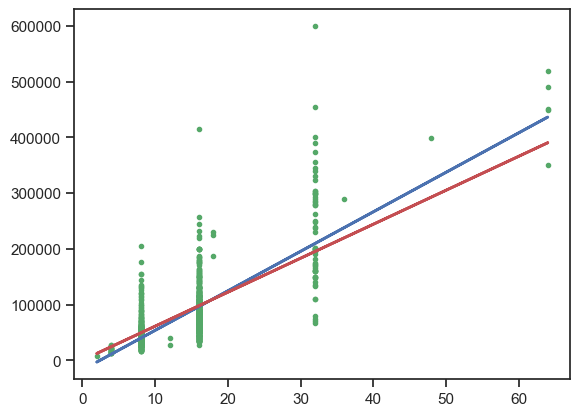

In [24]:
# Примеры использования градиентного спуска
show_gradient_descent(10, 0, 0)

b0 = -17138.53602856121 - (теоретический), -5606.846438608219 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 6437.136979179189 - (градиентный спуск)
MSE = 27754413.802075945


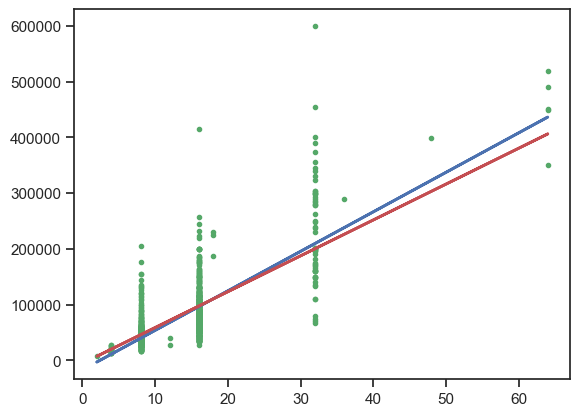

In [25]:
show_gradient_descent(1000, 0, 0)

b0 = -17138.53602856121 - (теоретический), -17138.536012511086 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 7089.829788128311 - (градиентный спуск)
MSE = 5.376540020271552e-11


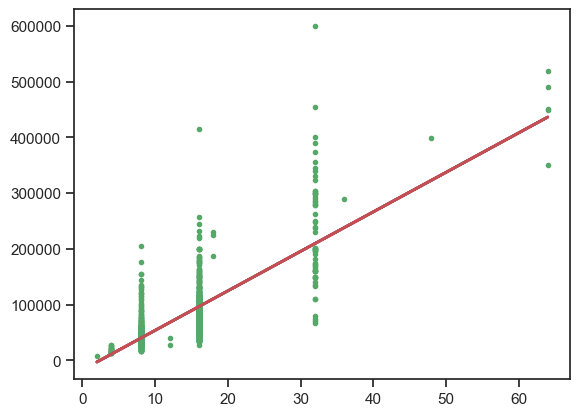

CPU times: total: 1.56 s
Wall time: 1.81 s


In [26]:
%%time
show_gradient_descent(50000, 0, 0)

b0 = -17138.53602856121 - (теоретический), -17138.536028556882 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 7089.829789036501 - (градиентный спуск)
MSE = 3.9142063709140234e-18


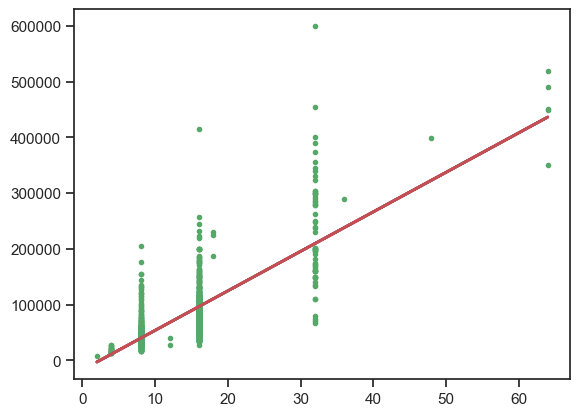

CPU times: total: 3.2 s
Wall time: 3.4 s


In [27]:
%%time
show_gradient_descent(100000, 0, 0)

b0 = -17138.53602856121 - (теоретический), -17138.536028556882 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 7089.829789036501 - (градиентный спуск)
MSE = 3.9142063709140234e-18


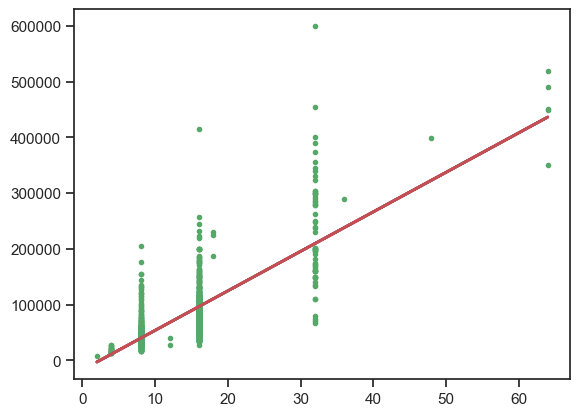

CPU times: total: 32.6 s
Wall time: 37.8 s


In [28]:
%%time
show_gradient_descent(1000000, 0, 0)

b0 = -17138.53602856121 - (теоретический), -5626.7562298113235 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 6438.26387194392 - (градиентный спуск)
MSE = 27658658.960093852


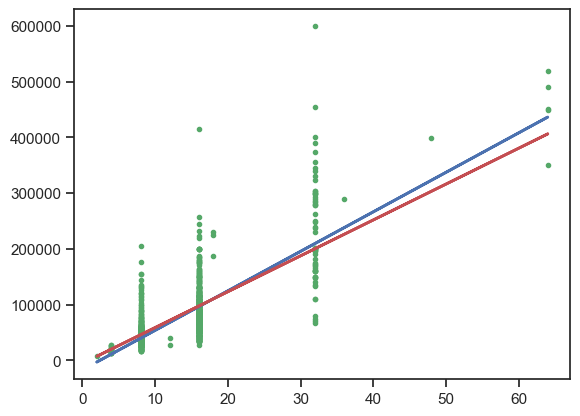

In [29]:
# Сходимость алгоритма может сильно зависеть от начальных значений
show_gradient_descent(1000, -30, 5)

b0 = -17138.53602856121 - (теоретический), -17138.536028556882 - (градиентный спуск)
b1 = 7089.829789036747 - (теоретический), 7089.829789036501 - (градиентный спуск)
MSE = 3.9142063709140234e-18


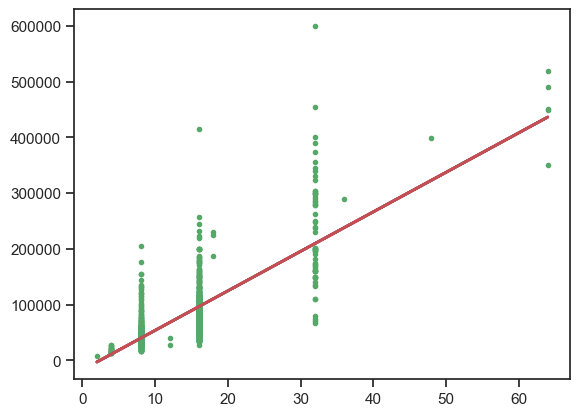

In [30]:
show_gradient_descent(100000, -30, 5)

### Использование класса [LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html) библиотеки scikit-learn.

In [31]:
# Обучим линейную регрессию и сравним коэффициенты с рассчитанными ранее
reg1 = LinearRegression().fit(x_array.reshape(-1, 1), y_array.reshape(-1, 1))
(b1, reg1.coef_), (b0, reg1.intercept_)

((7089.829789036747, array([[7089.82978904]])),
 (-17138.53602856121, array([-17138.53602856])))

### [Стохастический градиентный спуск](http://www.machinelearning.ru/wiki/index.php?title=%D0%A1%D1%82%D0%BE%D1%85%D0%B0%D1%81%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D0%B9_%D0%B3%D1%80%D0%B0%D0%B4%D0%B8%D0%B5%D0%BD%D1%82%D0%BD%D1%8B%D0%B9_%D1%81%D0%BF%D1%83%D1%81%D0%BA)

Пердполагает, что обучение на каждом шаге (эпохе) происходит не на полном наборе данных а на одном случайно выбранном примере. В случае большой обучающей выборки такой подход может многократно ускорить обучение.

В соответствии с [рекомендуемыми методами scikit-learn](https://scikit-learn.org/stable/tutorial/machine_learning_map/index.html) стохастический градиентный спуск рекомендуется использовать для задачи регрессии, если размер выборки превышает 100 000 записей.

В библиотеке scikit-learn используются классы:
- [SGDRegressor](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDRegressor.html) для регрессии.
- [SGDClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html) для классификации.

In [32]:
# Для небольшой выборки качество обучения сильно уступает нестохастическому градиентному спуску.
print('Размер выборки - {}'.format(x_array.shape[0]))
reg2 = SGDRegressor().fit(x_array.reshape(-1, 1), y_array)
(b1, reg2.coef_), (b0, reg2.intercept_)

Размер выборки - 1020


((7089.829789036747, array([8577.51059912])),
 (-17138.53602856121, array([-17088.56218069])))

## Использование регуляризации в линейных моделях

In [33]:
from sklearn.linear_model import Lasso

In [34]:
reg3 = Lasso().fit(x_array.reshape(-1, 1), y_array)
(b1, reg3.coef_), (b0, reg3.intercept_)

((7089.829789036747, array([7089.81042389])),
 (-17138.53602856121, -17138.265068335677))

In [35]:
from sklearn.linear_model import Ridge

In [36]:
reg4 = Ridge().fit(x_array.reshape(-1, 1), y_array)
(b1, reg4.coef_), (b0, reg4.intercept_)

((7089.829789036747, array([7089.69518804])),
 (-17138.53602856121, -17136.652670318712))

In [37]:
from sklearn.linear_model import ElasticNet

In [38]:
reg5 = ElasticNet().fit(x_array.reshape(-1, 1), y_array)
(b1, reg5.coef_), (b0, reg5.intercept_)

((7089.829789036747, array([7021.83070177])),
 (-17138.53602856121, -16187.082133001968))

## [Нелинейная регрессия](https://ru.wikipedia.org/wiki/%D0%9D%D0%B5%D0%BB%D0%B8%D0%BD%D0%B5%D0%B9%D0%BD%D0%B0%D1%8F_%D1%80%D0%B5%D0%B3%D1%80%D0%B5%D1%81%D1%81%D0%B8%D1%8F)

Используется в том случае, когда данные аппроксимируются моделью, которая является более сложной, чем линейная.

В библиотеке scikit-learn реализован класс [PolynomialFeatures](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html) для [полиномиальной регрессии.](http://www.machinelearning.ru/wiki/index.php?title=%D0%9B%D0%B8%D0%BD%D0%B5%D0%B9%D0%BD%D0%B0%D1%8F_%D1%80%D0%B5%D0%B3%D1%80%D0%B5%D1%81%D1%81%D0%B8%D1%8F)

Необходимо отметить, что возведение признака в степень или произведение признаков не является линейным преобразованием признаков и не может отрицательно повлиять на качество модели.

Для комбинации классов используются [конвейры (pipeline).](https://scikit-learn.org/stable/modules/compose.html#pipeline)

In [39]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

In [40]:
poly_model = Pipeline([('poly', PolynomialFeatures(degree=3)),
                       ('linear', LinearRegression(fit_intercept=False))])

In [41]:
poly_model.fit(x_array.reshape(-1, 1), y_array)

Pipeline(steps=[('poly', PolynomialFeatures(degree=3)),
                ('linear', LinearRegression(fit_intercept=False))])

In [42]:
poly_y_pred = poly_model.predict(x_array.reshape(-1, 1))

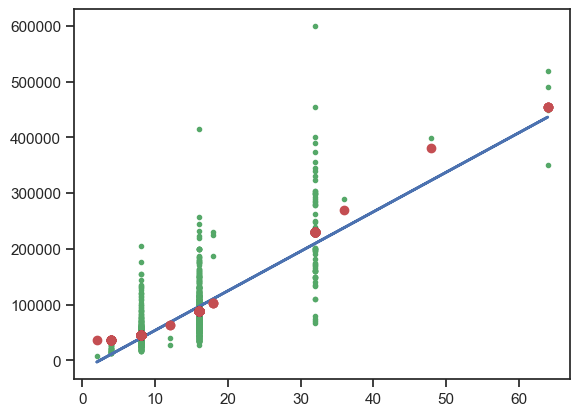

In [43]:
plt.plot(x_array, y_array, 'g.')
plt.plot(x_array, y_array_regr, 'b', linewidth=2.0)
plt.plot(x_array, poly_y_pred, 'ro')
plt.show()

In [44]:
# Степени полинома
poly_model.named_steps['linear'].coef_, poly_model.named_steps['linear'].intercept_

(array([ 3.71704309e+04, -1.42914313e+03,  3.42551771e+02, -3.41142622e+00]),
 0.0)

In [45]:
def test_poly_model(degree=3):
    poly_model = Pipeline([('poly', PolynomialFeatures(degree=degree)),
                       ('linear', LinearRegression(fit_intercept=False))])
    poly_model.fit(x_array.reshape(-1, 1), y_array)
    poly_y_pred = poly_model.predict(x_array.reshape(-1, 1))
    
    plt.plot(x_array, y_array, 'g.')
    plt.plot(x_array, y_array_regr, 'b', linewidth=2.0)
    plt.plot(x_array, poly_y_pred, 'ro')
    plt.show()
    
    print('Степени полинома - {}'.format(poly_model.named_steps['linear'].coef_))

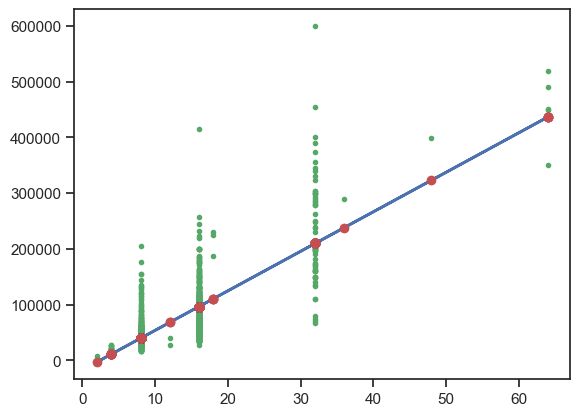

Степени полинома - [-17138.53602856   7089.82978904]


In [46]:
test_poly_model(degree=1)

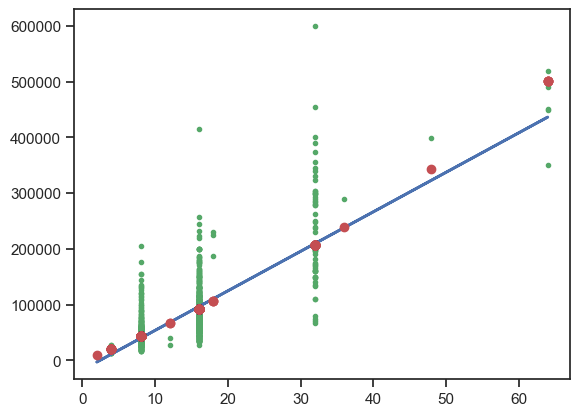

Степени полинома - [-983.22791294 5207.02436719   41.18186419]


In [47]:
test_poly_model(degree=2)

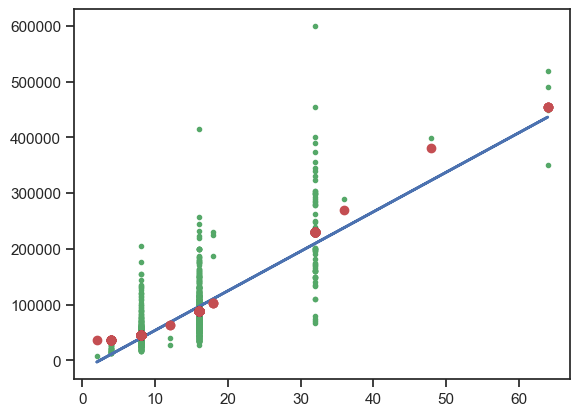

Степени полинома - [ 3.71704309e+04 -1.42914313e+03  3.42551771e+02 -3.41142622e+00]


In [48]:
test_poly_model(degree=3)

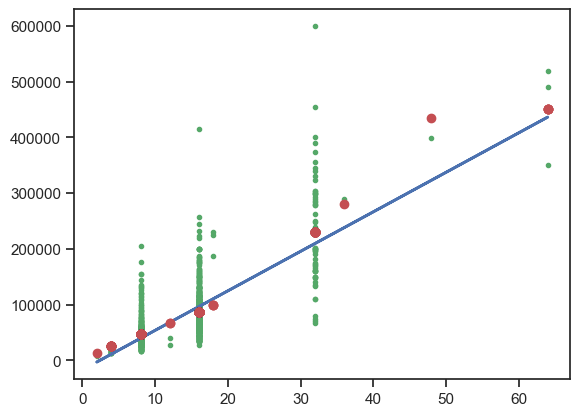

Степени полинома - [-1.32327082e+03  8.15841346e+03 -3.80809298e+02  1.62963755e+01
 -1.65826349e-01]


In [49]:
test_poly_model(degree=4)

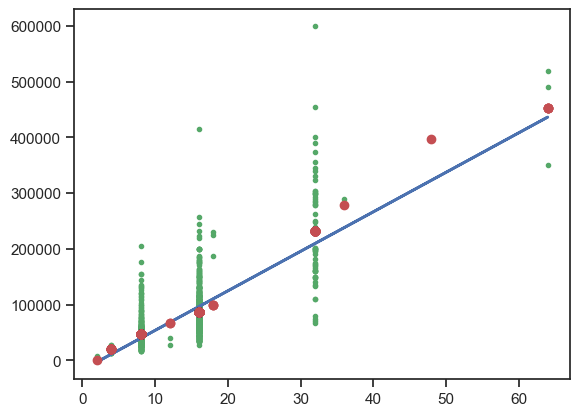

Степени полинома - [-2.67132551e+04  1.58583800e+04 -1.18059998e+03  5.26151091e+01
 -8.92046000e-01  5.09720561e-03]


In [50]:
test_poly_model(degree=5)

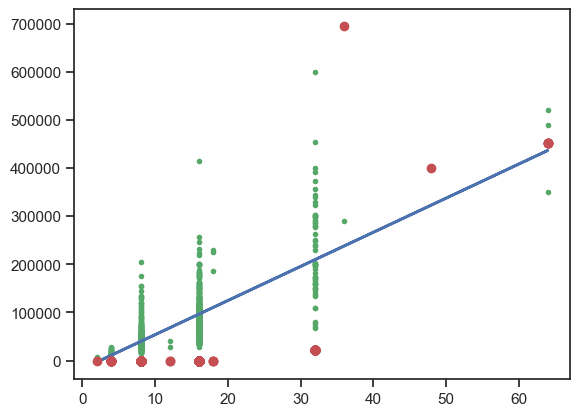

Степени полинома - [ 3.93944367e-49  6.62294227e-50 -6.96725567e-57  3.11150764e-61
  3.95162685e-88  1.31834349e-87  4.47241304e-86  1.52245294e-84
  5.20020104e-83  1.78214828e-81  6.12739099e-80  2.11331046e-78
  7.31041122e-77  2.53590071e-75  8.81943675e-74  3.07437590e-72
  1.07386558e-70  3.75719981e-69  1.31617296e-67  4.61388898e-66
  1.61749181e-64  5.66600383e-63  1.98109516e-61  6.90421588e-60
  2.39376914e-58  8.23542577e-57  2.80128126e-55  9.37223489e-54
  3.06058873e-52  9.63952042e-51  2.87084449e-49  7.79888725e-48
  1.78980887e-46  2.77559319e-45 -1.01372235e-46  9.05622890e-49]


In [51]:
test_poly_model(degree=35)

In [52]:
# Определение функции
# f(0)=0.5
x = np.linspace(-7, 7, 31)
y = 1 / (1 + np.exp(-x))
list(zip(x,y))

[(-7.0, 0.0009110511944006454),
 (-6.533333333333333, 0.0014520391100099122),
 (-6.066666666666666, 0.0023135251651203942),
 (-5.6, 0.003684239899435989),
 (-5.133333333333333, 0.005862302196338335),
 (-4.666666666666666, 0.009315959345066693),
 (-4.2, 0.014774031693273055),
 (-3.7333333333333334, 0.023354516476977092),
 (-3.2666666666666666, 0.03673259067202974),
 (-2.8, 0.057324175898868755),
 (-2.333333333333333, 0.08839967720705845),
 (-1.8666666666666663, 0.1339278883240737),
 (-1.4000000000000004, 0.1978161114414182),
 (-0.9333333333333336, 0.28224894304225995),
 (-0.4666666666666668, 0.3854055017324505),
 (0.0, 0.5),
 (0.4666666666666668, 0.6145944982675495),
 (0.9333333333333336, 0.71775105695774),
 (1.4000000000000004, 0.8021838885585818),
 (1.8666666666666671, 0.8660721116759263),
 (2.333333333333334, 0.9116003227929417),
 (2.8000000000000007, 0.9426758241011313),
 (3.2666666666666675, 0.9632674093279703),
 (3.7333333333333343, 0.9766454835230229),
 (4.199999999999999, 0.9852

## Линейная модель

In [53]:
reg1 = LinearRegression().fit(x_train, y_train)
(b1, reg1.coef_), (b0, reg1.intercept_)

((7089.829789036747,
  array([ 8.70852618e+00, -7.45799870e+03, -7.24279959e+03, -3.62139980e+03,
          3.29350322e+03,  4.33075800e+01, -3.70368712e+04,  2.26446620e+02,
          2.35584339e+02, -4.06053914e+03,  2.92955802e+01, -1.51722483e+03,
         -9.14748476e+03,  1.66685360e+03, -3.21403209e+03,  1.97775083e+04,
         -2.20349149e+03])),
 (-17138.53602856121, 509350.7036347282))

In [54]:
y_pred = reg1.predict(x_test)
mean_absolute_error(y_test, y_pred)


24913.04654976365

## Полиноминальная модель

In [56]:
poly_model = Pipeline([('poly', PolynomialFeatures(degree=3)),
                       ('linear', LinearRegression(fit_intercept=False))])

16542137396.78598


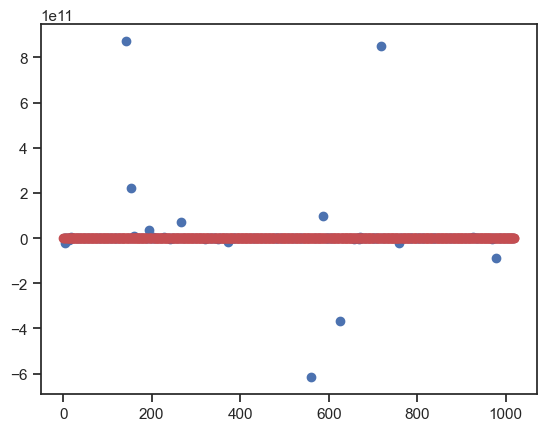

In [57]:
y_pred = poly_model.fit(x_train, y_train).predict(x_test)
print(mean_absolute_error(y_test, y_pred))
plt.scatter(x_test.iloc[:, 0], y_pred, c='b')
plt.scatter(x_train.iloc[:, 0], y_train, c='r')
plt.show()

## SVM

In [58]:
from sklearn.svm import SVC, NuSVC, LinearSVC, OneClassSVM, SVR, NuSVR, LinearSVR


In [59]:
def plot_regr(clf):
    title = clf.__repr__
    clf.fit(x_train, y_train)
    y_pred = clf.predict(x_test)
    fig, ax = plt.subplots(figsize=(5,5))
    ax.set_title(title)
    ax.plot(x_train.iloc[:, 0], y_train, 'b.')
    ax.plot(x_test.iloc[:, 0], y_pred, 'ro')
    plt.show()
    print(mean_absolute_error(y_test, y_pred))

d:\st\семестр 6\тмо\лр\.venv\Lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
d:\st\семестр 6\тмо\лр\.venv\Lib\site-packages\sklearn\svm\_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


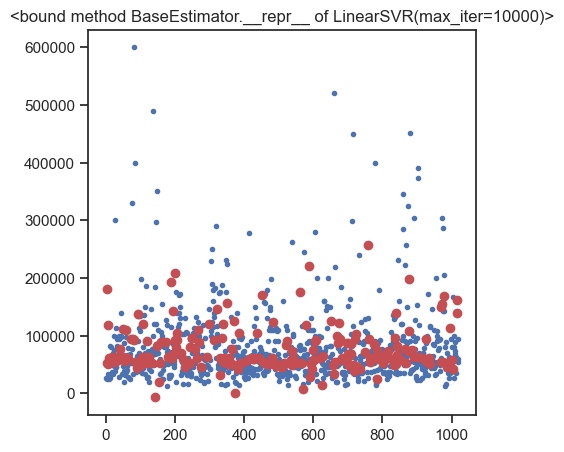

29346.619898310397


In [60]:
plot_regr(LinearSVR(C=1.0, max_iter=10000))

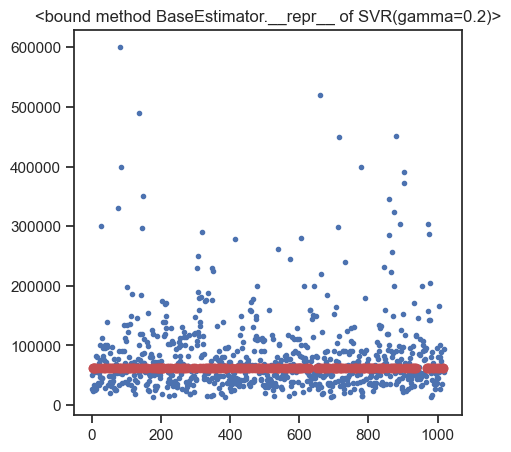

43163.12227460353


In [61]:
plot_regr(SVR(kernel='rbf', gamma=0.2, C=1.0))

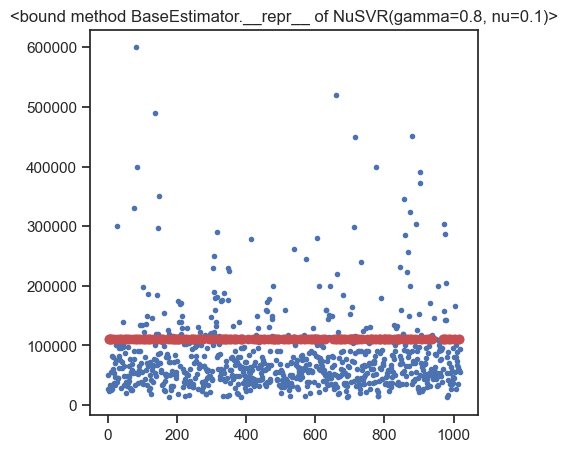

57858.03341642399


In [62]:
plot_regr(NuSVR(kernel='rbf', gamma=0.8, nu=0.1, C=1.0))


## Дерево решений

In [63]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, export_graphviz


In [64]:
def plot_tree_regression(X_train, y_train, X_test):
    """
    Построение деревьев и вывод графиков для заданного датасета
    """

    # Обучение регрессионной модели
    regr_1 = DecisionTreeRegressor(max_depth=3)
    regr_2 = DecisionTreeRegressor(max_depth=10)
    regr_1.fit(X_train, y_train)
    regr_2.fit(X_train, y_train)

    # Предсказание
    y_1 = regr_1.predict(X_test)
    y_2 = regr_2.predict(X_test)

    # Вывод графика
    fig, ax = plt.subplots(figsize=(15,7))
    plt.scatter(X_train.iloc[:, 0], y_train, s=20,c="g", label="Данные")
    plt.scatter(X_test.iloc[:, 0], y_1, color="b", label="max_depth=3", linewidth=2)
    plt.scatter(X_test.iloc[:, 0], y_2, c="r", label="max_depth=10", linewidth=2)
    plt.xlabel("Данные")
    plt.ylabel("Целевой признак")
    plt.title("Регрессия на основе дерева решений")
    plt.legend()
    plt.show()

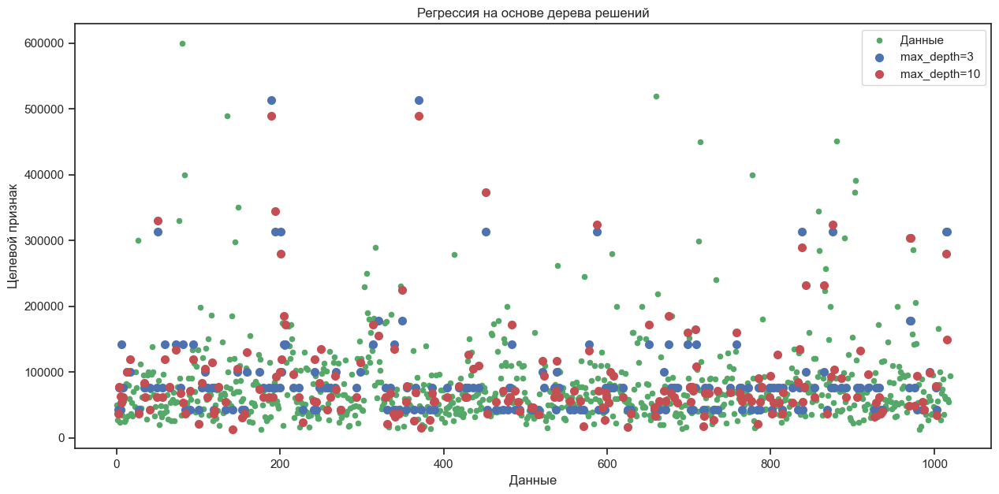

In [65]:
plot_tree_regression(x_train, y_train, x_test)

In [66]:
from operator import itemgetter

def draw_feature_importances(tree_model, X_dataset, figsize=(18,5)):
    """
    Вывод важности признаков в виде графика
    """
    # Сортировка значений важности признаков по убыванию
    list_to_sort = list(zip(X_dataset.columns.values, tree_model.feature_importances_))
    sorted_list = sorted(list_to_sort, key=itemgetter(1), reverse = True)
    # Названия признаков
    labels = [x for x,_ in sorted_list]
    # Важности признаков
    data = [x for _,x in sorted_list]
    # Вывод графика
    fig, ax = plt.subplots(figsize=figsize)
    ind = np.arange(len(labels))
    plt.bar(ind, data)
    plt.xticks(ind, labels, rotation='vertical')
    # Вывод значений
    for a,b in zip(ind, data):
        plt.text(a-0.05, b+0.01, str(round(b,3)))
    plt.show()
    return labels, data

In [67]:
tree_regr = DecisionTreeRegressor(random_state=1)
tree_regr.fit(x_train, y_train)

DecisionTreeRegressor(random_state=1)

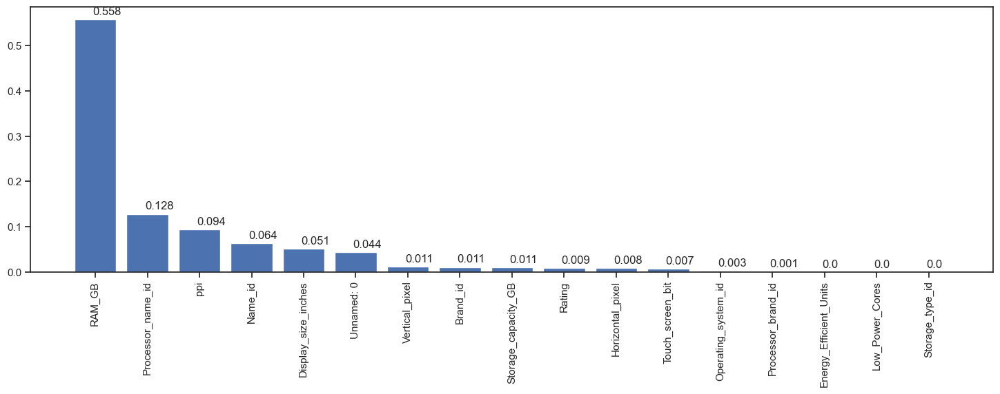

In [68]:
tree_regr_fl, tree_regr_fd = draw_feature_importances(tree_regr, x_train)


In [69]:
import sys
!python -m pip install pydotplus

In [70]:

from io import StringIO 
from IPython.display import Image
import graphviz 
from pydotplus import graph_from_dot_data


def get_png_tree(tree_model_param, feature_names_param):
    dot_data = StringIO()
    export_graphviz(tree_model_param, out_file=dot_data, feature_names=feature_names_param,
                    filled=True, rounded=True, special_characters=True)
    graph = graph_from_dot_data(dot_data.getvalue())
    return graph.create_png()

In [71]:
Image(get_png_tree(tree_regr, x_train.columns), height='100%')


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.519855 to fit



In [72]:
df = numeric_data.drop(["Price"], axis=1)
df_sorted = df[tree_regr_fl]
df_sorted.head(5)

,RAM_GB,Processor_name_id,ppi,Name_id,Display_size_inches,Unnamed: 0,Vertical_pixel,Brand_id,Storage_capacity_GB,Rating,Horizontal_pixel,Touch_screen_bit,Operating_system_id,Processor_brand_id,Energy_Efficient_Units,Low_Power_Cores,Storage_type_id
0,8,4,141.21,580,15.6,0,1080,11,512,4.30,1920,1,11,0,0,0.0,2
1,8,3,141.21,837,15.6,1,1080,17,512,4.45,1920,0,11,0,0,0.0,2
2,8,23,141.21,426,15.6,2,1080,11,512,4.65,1920,0,11,3,0,0.0,2
3,16,24,165.63,992,13.3,3,1920,23,512,4.75,1080,0,11,3,0,0.0,2
4,8,23,141.21,994,15.6,4,1080,24,512,4.25,1920,0,11,3,0,0.0,2


In [73]:
sorted_X_train, sorted_X_test, sorted_y_train, sorted_y_test = train_test_split(
    df_sorted, data["Price"], test_size=0.3, random_state=1)

In [74]:
tree_regr_feat_1 = DecisionTreeRegressor(random_state=1).fit(sorted_X_train, sorted_y_train)
y_test_predict = tree_regr_feat_1.predict(sorted_X_test)
y_test_predict.shape

(306,)

In [75]:
mean_absolute_error(sorted_y_test, y_test_predict)


23352.993464052288

In [76]:
tree_regr_feat_2 = DecisionTreeRegressor(random_state=1).fit(
    sorted_X_train[tree_regr_fl[0:5]], sorted_y_train)
y_test_predict_2 = tree_regr_feat_2.predict(sorted_X_test[tree_regr_fl[0:5]])
y_test_predict_2.shape

(306,)

In [77]:
mean_absolute_error(sorted_y_test, y_test_predict_2)


22388.385620915033

In [78]:
Image(get_png_tree(tree_regr_feat_2, x_train.columns[0:5]), height='100%')


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.614086 to fit



In [79]:
X_range = list(range(1, len(sorted_X_train.columns)+1))


In [80]:
mae_list = []
for i in X_range:
    # Обучим дерево и предскажем результаты на заданном количестве признаков 
    tree_regr_feat_3 = DecisionTreeRegressor(random_state=1).fit(
        sorted_X_train[tree_regr_fl[0:i]], sorted_y_train)
    y_test_predict_3 = tree_regr_feat_3.predict(sorted_X_test[tree_regr_fl[0:i]])
    temp_mae = mean_absolute_error(sorted_y_test, y_test_predict_3)
    mae_list.append(temp_mae)

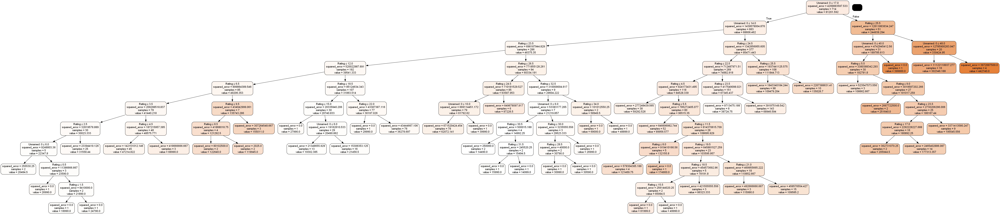

In [81]:
Image(get_png_tree(DecisionTreeRegressor(random_state=1).fit(
        sorted_X_train[tree_regr_fl[0:2]], sorted_y_train), x_train.columns[0:2]), height='100%')


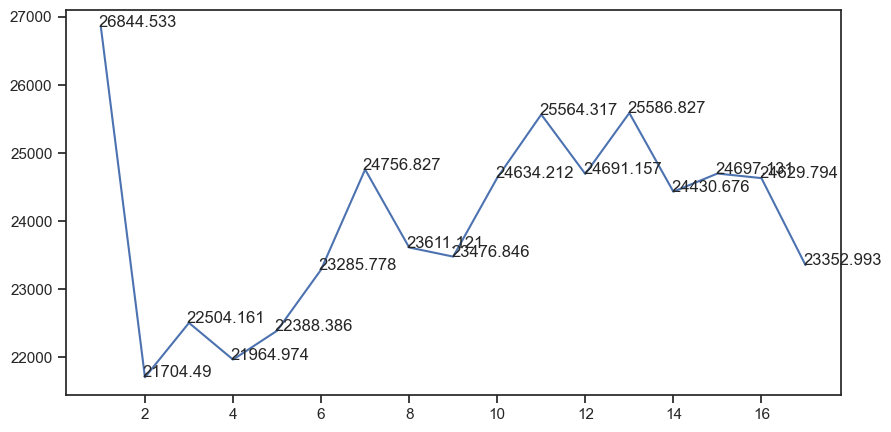

In [82]:
plt.subplots(figsize=(10,5))
plt.plot(X_range, mae_list)
for a,b in zip(X_range, mae_list):
    plt.text(a-0.05, b+0.01, str(round(b,3)))
plt.show()

In [83]:
import sys
!python -m pip install graphviz

In [84]:
import graphviz

dot_data = export_graphviz(tree_regr_fl, out_file=None, 
                           feature_names=sorted_y_test, 
                           class_names=sorted_X_test, 
                           filled=True, rounded=True, special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

TypeError: ['RAM_GB', 'Processor_name_id', 'ppi', 'Name_id', 'Display_size_inches', 'Unnamed: 0', 'Vertical_pixel', 'Brand_id', 'Storage_capacity_GB', 'Rating', 'Horizontal_pixel', 'Touch_screen_bit', 'Operating_system_id', 'Processor_brand_id', 'Energy_Efficient_Units', 'Low_Power_Cores', 'Storage_type_id'] is not an estimator instance.

In [ ]:

def get_png_tree(tree_model_param, feature_names_param):
    dot_data = StringIO()
    export_graphviz(tree_model_param, out_file=dot_data, feature_names=feature_names_param,
                    filled=True, rounded=True, special_characters=True)
    graph = graphviz.Source(dot_data) 
    return graph

In [ ]:
Image(get_png_tree(tree_regr, x_train.columns), height='100%')


AttributeError: '_io.StringIO' object has no attribute 'endswith'

AttributeError: '_io.StringIO' object has no attribute 'endswith'

<IPython.core.display.Image object>

In [ ]:
import os
os.environ["PATH"] += os.pathsep + 'С:/Program Files/Graphviz/bin/'

In [ ]:
dot_data = StringIO()
export_graphviz(tree_regr, out_file=dot_data, feature_names=x_train.columns,
                    filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data) 
graph

ExecutableNotFound: failed to execute WindowsPath('dot'), make sure the Graphviz executables are on your systems' PATH